# Spark Funds Investment Analysis Assignment
### Project Brief
Spark Funds wants to make investments in a few companies. The CEO of Spark Funds wants to understand the global trends in investments so that she can take the investment decisions effectively.

### Business and Data Understanding
Spark Funds has two minor constraints for investments:
- It wants to invest between 5 to 15 million USD per round of investment

- It wants to invest only in English-speaking countries because of the ease of communication with companies it would invest in

### Goal of this analysis
- Investment type analysis 
- Country analysis
- Sector analysis

In [1]:
#importing all necessary libraries at first
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
#to check the enconding
import chardet

#ignore warnings if anything 
import warnings
warnings.filterwarnings('ignore')
#setting the theme to white
sns.set(style="white")

In [2]:
#The encoding  palmos was working fine and fetching correct records so used 'palmos' 
companies = pd.read_csv("companies.csv", encoding='palmos')
rounds2 = pd.read_csv("rounds2.csv", encoding='palmos')

In [3]:
#setting vertical scrolling 
pd.set_option("display.max_rows", None)

## Part 1 - Table-1.1

In [4]:
#check the company table data and its shape to get the information of columns and total observation
companies.info()

print(companies.shape, "\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66368 entries, 0 to 66367
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   permalink      66368 non-null  object
 1   name           66367 non-null  object
 2   homepage_url   61310 non-null  object
 3   category_list  63220 non-null  object
 4   status         66368 non-null  object
 5   country_code   59410 non-null  object
 6   state_code     57821 non-null  object
 7   region         58338 non-null  object
 8   city           58340 non-null  object
 9   founded_at     51147 non-null  object
dtypes: object(10)
memory usage: 5.1+ MB
(66368, 10) 



In [5]:
#chech the rows and columns if data is relevant  
companies.head(10)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at
0,/Organization/-Fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN
1,/Organization/-Qounter,:Qounter,http://www.qounter.com,Application Platforms|Real Time|Social Network...,operating,USA,DE,DE - Other,Delaware City,04-09-2014
2,/Organization/-The-One-Of-Them-Inc-,"(THE) ONE of THEM,Inc.",http://oneofthem.jp,Apps|Games|Mobile,operating,NaN,NaN,NaN,NaN,NaN
3,/Organization/0-6-Com,0-6.com,http://www.0-6.com,Curated Web,operating,CHN,22,Beijing,Beijing,01-01-2007
4,/Organization/004-Technologies,004 Technologies,http://004gmbh.de/en/004-interact,Software,operating,USA,IL,"Springfield, Illinois",Champaign,01-01-2010
5,/Organization/01Games-Technology,01Games Technology,http://www.01games.hk/,Games,operating,HKG,NaN,Hong Kong,Hong Kong,NaN
6,/Organization/0Ndine-Biomedical-Inc,Ondine Biomedical Inc.,http://ondinebio.com,Biotechnology,operating,CAN,BC,Vancouver,Vancouver,01-01-1997
7,/Organization/0Xdata,H2O.ai,http://h2o.ai/,Analytics,operating,USA,CA,SF Bay Area,Mountain View,01-01-2011
8,/Organization/1,One Inc.,http://whatis1.com,Mobile,operating,USA,CA,SF Bay Area,San Francisco,01-08-2011
9,/Organization/1-2-3-Listo,"1,2,3 Listo",http://www.123listo.com,E-Commerce,operating,CHL,12,Santiago,Las Condes,01-01-2012


#### Question 1

#### How many unique companies are present in the companies file?
#### Ans: 66368

In [6]:
#check the duplicacy of columns(we do not have any duplicates in permalink column)
print(companies["permalink"].duplicated().any())
#checking the duplicated data in name
print(companies["name"].duplicated().any())
#the company permalink column has Unique values which implies that the permalink is unique column

False
True


In [7]:
# Check the unique entries for company and comapny name
print(len(companies["permalink"].unique()))
print(len(companies.name.unique()))


66368
66100


In [8]:
#convert the Permalink to lowercase to merge the data below with rounds2 dataframe 
#(by looking at manually the two files are not case specific which will not make them unique while merging )
companies["permalink"] = companies.permalink.str.lower()
companies["permalink"]

0                                      /organization/-fame
1                                   /organization/-qounter
2                      /organization/-the-one-of-them-inc-
3                                    /organization/0-6-com
4                           /organization/004-technologies
5                         /organization/01games-technology
6                      /organization/0ndine-biomedical-inc
7                                     /organization/0xdata
8                                          /organization/1
9                                /organization/1-2-3-listo
10                                   /organization/1-4-all
11                          /organization/1-618-technology
12                             /organization/1-800-dentist
13                             /organization/1-800-doctors
14                /organization/1-800-publicrelations-inc-
15                              /organization/1-mainstream
16                                   /organization/1-of-

##### Note: the company has column permalink with Unique values which implies that the permalink is unique column 
##### Question-3

##### In the companies data frame, which column can be used as the  unique key for each company? Write the name of the column.

##### Answer : permalink

In [9]:
# round2 data analysis
#check the obervations of rounds2 file
print(rounds2.info())
#check the entries
rounds2.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114949 entries, 0 to 114948
Data columns (total 6 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   company_permalink        114949 non-null  object 
 1   funding_round_permalink  114949 non-null  object 
 2   funding_round_type       114949 non-null  object 
 3   funding_round_code       31140 non-null   object 
 4   funded_at                114949 non-null  object 
 5   raised_amount_usd        94959 non-null   float64
dtypes: float64(1), object(5)
memory usage: 5.3+ MB
None


(114949, 6)

In [10]:
#analyze the data of rounds2
rounds2.head(10)
#notice the data you would see here is lower and uppercase we have to make them in lower case

,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd
0,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,10000000.0
1,/ORGANIZATION/-QOUNTER,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,A,14-10-2014,NaN
2,/organization/-qounter,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,NaN,01-03-2014,700000.0
3,/ORGANIZATION/-THE-ONE-OF-THEM-INC-,/funding-round/650b8f704416801069bb178a1418776b,venture,B,30-01-2014,3406878.0
4,/organization/0-6-com,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,19-03-2008,2000000.0
5,/ORGANIZATION/004-TECHNOLOGIES,/funding-round/1278dd4e6a37fa4b7d7e06c21b3c1830,venture,NaN,24-07-2014,NaN
6,/organization/01games-technology,/funding-round/7d53696f2b4f607a2f2a8cbb83d01839,undisclosed,NaN,01-07-2014,41250.0
7,/ORGANIZATION/0NDINE-BIOMEDICAL-INC,/funding-round/2b9d3ac293d5cdccbecff5c8cb0f327d,seed,NaN,11-09-2009,43360.0
8,/organization/0ndine-biomedical-inc,/funding-round/954b9499724b946ad8c396a57a5f3b72,venture,NaN,21-12-2009,719491.0
9,/ORGANIZATION/0XDATA,/funding-round/383a9bd2c04f7038bb543ccef5ba3eae,seed,NaN,22-05-2013,3000000.0


###### Note that we have duplicated data into rounds2 and also has uppercase lets convert it into uniformity

In [11]:
#change the upper to lower case and see the unique records
# How many unique companies are present in rounds2?
print(len(rounds2.company_permalink.str.lower().unique()))
#this seems to be correct so lets modify the rounds2 dataframe

66368


In [12]:
#Convert the uppercase to lowercase for rounds2 dataframe 
rounds2["company_permalink"] = rounds2.company_permalink.str.lower()
rounds2["company_permalink"]

0                                       /organization/-fame
1                                    /organization/-qounter
2                                    /organization/-qounter
3                       /organization/-the-one-of-them-inc-
4                                     /organization/0-6-com
5                            /organization/004-technologies
6                          /organization/01games-technology
7                       /organization/0ndine-biomedical-inc
8                       /organization/0ndine-biomedical-inc
9                                      /organization/0xdata
10                                     /organization/0xdata
11                                     /organization/0xdata
12                                     /organization/0xdata
13                                          /organization/1
14                                          /organization/1
15                                          /organization/1
16                                /organ

#### Qestion 2

#### How many unique companies are present in the companies file?
#### Ans: 66368

In [13]:
#lets check the mean and median 
rounds2.describe()

,raised_amount_usd
count,9.495900e+04
mean,1.042687e+07
std,1.148212e+08
min,0.000000e+00
25%,3.225000e+05
50%,1.680511e+06
75%,7.000000e+06
max,2.127194e+10


##### Q: Are there any companies in the rounds2 file which are not  present in companies ? Answer Y/N.
##### No , because the data below in sets validtates there are no such diffrence 

In [14]:
# Are there any companies in the rounds2 file which are not  present in companies ? Answer Y/N.
#lets check if there are any diffrences in dataframes of companieslink
set1 = set(companies['permalink'].unique())
set2 = set(rounds2['company_permalink'].unique())
common = set1.intersection(set2)
uncommon = set1.difference(set2)
# len(common)
# check the data in both the sets 
print(len(set1))
print(len(set2))
#check common entries for both the dataframe
print(len(common))
#check if there is any difference in data
print(len(uncommon))

66368
66368
66368
0


In [15]:
#making sure if there are anything which is present in rounds2 but not in companies and ideally it should be zero
print(len(rounds2.loc[~rounds2['company_permalink'].isin(companies['permalink']), :]))


0


# Cleaning Data
#####  Before merging the data lets clean the data from each dataframe to make sure we are merging right data 
#### activity involved
- Inspecting Null Values
- Dropping Unnecessary columns
- Dropping Uncessary rows

In [16]:
#check the companies null value
companies.isnull().sum()

permalink            0
name                 1
homepage_url      5058
category_list     3148
status               0
country_code      6958
state_code        8547
region            8030
city              8028
founded_at       15221
dtype: int64

In [17]:
#check the rounds2 data has null or not
rounds2.isnull().sum()

company_permalink              0
funding_round_permalink        0
funding_round_type             0
funding_round_code         83809
funded_at                      0
raised_amount_usd          19990
dtype: int64

#### Note: Since there are no missing values in the permalink or company_permalink columns, let’s merge the two and then work on the master data frame.

### perform joins to merge the dataframes companies and rounds2
#### Note: we have performed inner join coz the entries are common and present in both table  and hence we are not loosing any data


In [18]:
#since all the companies link are in both the table we can perform the inner join and hence no loss of data 
master_frame = pd.merge(companies, rounds2, how = 'inner', left_on = 'permalink', right_on = 'company_permalink')
master_frame.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,10000000.0
1,/organization/-qounter,:Qounter,http://www.qounter.com,Application Platforms|Real Time|Social Network...,operating,USA,DE,DE - Other,Delaware City,04-09-2014,/organization/-qounter,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,A,14-10-2014,NaN
2,/organization/-qounter,:Qounter,http://www.qounter.com,Application Platforms|Real Time|Social Network...,operating,USA,DE,DE - Other,Delaware City,04-09-2014,/organization/-qounter,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,NaN,01-03-2014,700000.0
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",http://oneofthem.jp,Apps|Games|Mobile,operating,NaN,NaN,NaN,NaN,NaN,/organization/-the-one-of-them-inc-,/funding-round/650b8f704416801069bb178a1418776b,venture,B,30-01-2014,3406878.0
4,/organization/0-6-com,0-6.com,http://www.0-6.com,Curated Web,operating,CHN,22,Beijing,Beijing,01-01-2007,/organization/0-6-com,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,19-03-2008,2000000.0


In [19]:
#checking the columns and entries after merging the data
master_frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114949 entries, 0 to 114948
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   permalink                114949 non-null  object 
 1   name                     114948 non-null  object 
 2   homepage_url             108815 non-null  object 
 3   category_list            111539 non-null  object 
 4   status                   114949 non-null  object 
 5   country_code             106271 non-null  object 
 6   state_code               104003 non-null  object 
 7   region                   104782 non-null  object 
 8   city                     104785 non-null  object 
 9   founded_at               94428 non-null   object 
 10  company_permalink        114949 non-null  object 
 11  funding_round_permalink  114949 non-null  object 
 12  funding_round_type       114949 non-null  object 
 13  funding_round_code       31140 non-null   object 
 14  fund

In [20]:
#total entries
master_frame.shape

(114949, 16)

In [21]:
#making the values in readable formate
pd.options.display.float_format = '{:.2f}'.format
master_frame.describe()

,raised_amount_usd
count,94959.00
mean,10426869.33
std,114821247.98
min,0.00
25%,322500.00
50%,1680511.00
75%,7000000.00
max,21271935000.00


#### Since the permalink and company_permalink column represent same data, we can remove one column.


In [22]:
# removing redundant columns
master_frame = master_frame.drop(['company_permalink'], axis = 1)

In [23]:
#Structure of dataframe
master_frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114949 entries, 0 to 114948
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   permalink                114949 non-null  object 
 1   name                     114948 non-null  object 
 2   homepage_url             108815 non-null  object 
 3   category_list            111539 non-null  object 
 4   status                   114949 non-null  object 
 5   country_code             106271 non-null  object 
 6   state_code               104003 non-null  object 
 7   region                   104782 non-null  object 
 8   city                     104785 non-null  object 
 9   founded_at               94428 non-null   object 
 10  funding_round_permalink  114949 non-null  object 
 11  funding_round_type       114949 non-null  object 
 12  funding_round_code       31140 non-null   object 
 13  funded_at                114949 non-null  object 
 14  rais

In [24]:
#check the missing values in each columns
master_frame.isnull().sum()

permalink                      0
name                           1
homepage_url                6134
category_list               3410
status                         0
country_code                8678
state_code                 10946
region                     10167
city                       10164
founded_at                 20521
funding_round_permalink        0
funding_round_type             0
funding_round_code         83809
funded_at                      0
raised_amount_usd          19990
dtype: int64

In [25]:
#check the percentage of missing values in each column to further analysis in the columns
round(100*(master_frame.isnull().sum()/len(master_frame.index)), 2)

permalink                  0.00
name                       0.00
homepage_url               5.34
category_list              2.97
status                     0.00
country_code               7.55
state_code                 9.52
region                     8.84
city                       8.84
founded_at                17.85
funding_round_permalink    0.00
funding_round_type         0.00
funding_round_code        72.91
funded_at                  0.00
raised_amount_usd         17.39
dtype: float64

####  The column  funding_round_code(73% null value),homepage_url, founded_at, state_code, region and city all are seems to be no use for this analysis so lets drop them

In [26]:
# drop columns 
master_frame = master_frame.drop(['funding_round_code', 'homepage_url', 'founded_at', 'state_code', 'region', 'city'], axis=1)
master_frame.head()

,permalink,name,category_list,status,country_code,funding_round_permalink,funding_round_type,funded_at,raised_amount_usd
0,/organization/-fame,#fame,Media,operating,IND,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,05-01-2015,10000000.00
1,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,operating,USA,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,14-10-2014,nan
2,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,operating,USA,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,01-03-2014,700000.00
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",Apps|Games|Mobile,operating,NaN,/funding-round/650b8f704416801069bb178a1418776b,venture,30-01-2014,3406878.00
4,/organization/0-6-com,0-6.com,Curated Web,operating,CHN,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,19-03-2008,2000000.00


In [27]:
#lets observe again the dataframe 
round(100*(master_frame.isnull().sum()/len(master_frame.index)), 2)

permalink                  0.00
name                       0.00
category_list              2.97
status                     0.00
country_code               7.55
funding_round_permalink    0.00
funding_round_type         0.00
funded_at                  0.00
raised_amount_usd         17.39
dtype: float64

#### three Important columns left :
- #### raised_amount_usd : going to use for further analysis on amount
- #### country_code  : we re going to use for countrywise analysis
- #### category_list : we are going to use for mapping the main categories 

## raised_amount_usd : cleaning

In [28]:
#lets clean the column raised_amount_usd which is important column 
master_frame['raised_amount_usd'].describe()

count         94959.00
mean       10426869.33
std       114821247.98
min               0.00
25%          322500.00
50%         1680511.00
75%         7000000.00
max     21271935000.00
Name: raised_amount_usd, dtype: float64

The below obeservation for this is : the min value and max values has huge difference and the mean and median values also has hug difference so lets see and remove the null values if it has any coz these column we are going to use for further analysis, note that this column has a huge importance so we are not deleting any data which are not null

<AxesSubplot:>

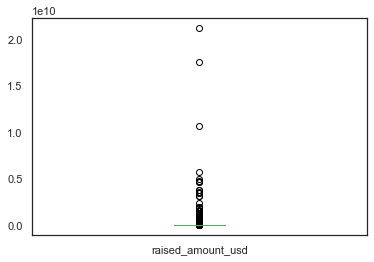

In [29]:
#if we see the box plot which has huge spread accross 
master_frame['raised_amount_usd'].plot.box()

In [30]:
#total null values exist 
master_frame['raised_amount_usd'].isnull().sum()

19990

In [31]:
# remove all null values
master_frame = master_frame[~(master_frame['raised_amount_usd'].isnull())]
master_frame.shape

(94959, 9)

In [32]:
#check if any null values exist to make sure we are on right track
master_frame[(master_frame['raised_amount_usd'].isnull())].shape

(0, 9)

In [33]:
#checking the data again 
master_frame.head()

,permalink,name,category_list,status,country_code,funding_round_permalink,funding_round_type,funded_at,raised_amount_usd
0,/organization/-fame,#fame,Media,operating,IND,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,05-01-2015,10000000.00
2,/organization/-qounter,:Qounter,Application Platforms|Real Time|Social Network...,operating,USA,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,01-03-2014,700000.00
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",Apps|Games|Mobile,operating,NaN,/funding-round/650b8f704416801069bb178a1418776b,venture,30-01-2014,3406878.00
4,/organization/0-6-com,0-6.com,Curated Web,operating,CHN,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,19-03-2008,2000000.00
6,/organization/01games-technology,01Games Technology,Games,operating,HKG,/funding-round/7d53696f2b4f607a2f2a8cbb83d01839,undisclosed,01-07-2014,41250.00


In [34]:
#check the mean and median again
master_frame.describe()

,raised_amount_usd
count,94959.00
mean,10426869.33
std,114821247.98
min,0.00
25%,322500.00
50%,1680511.00
75%,7000000.00
max,21271935000.00


In [35]:
#now lets analyz the other two columns
round(100*(master_frame.isnull().sum()/len(master_frame.index)), 2)

permalink                 0.00
name                      0.00
category_list             1.10
status                    0.00
country_code              6.16
funding_round_permalink   0.00
funding_round_type        0.00
funded_at                 0.00
raised_amount_usd         0.00
dtype: float64

## country_code : cleaning 

In [36]:
#check the count
master_frame['country_code'].describe()

count     89108
unique      134
top         USA
freq      62049
Name: country_code, dtype: object

In [37]:
# Since the column is categorical columns so we can change them into category and check the frequency of column
country_codes_counts = master_frame['country_code'].astype('category')
country_codes_counts.value_counts()
# master_frame['country_code'].value_counts()

USA    62049
GBR     5019
CAN     2616
CHN     1927
IND     1649
FRA     1451
ISR     1364
ESP     1074
DEU     1042
AUS      649
RUS      588
IRL      563
SWE      560
SGP      546
NLD      532
JPN      485
ITA      483
BRA      483
CHE      437
KOR      432
CHL      432
FIN      382
DNK      314
ARG      297
BEL      293
HKG      250
TUR      196
NOR      191
BGR      190
MEX      189
AUT      152
POL      146
NZL      129
EST      126
PRT      101
ARE       96
MYS       95
COL       94
CZE       75
PER       72
ZAF       71
IDN       66
PHL       60
TWN       60
THA       60
UKR       60
LVA       58
HUN       53
NGA       50
GRC       49
LUX       46
KEN       42
LTU       39
ROM       36
EGY       34
CYP       31
SVK       31
ISL       29
VNM       27
SVN       26
PAK       26
JOR       26
LBN       25
URY       21
VEN       20
SRB       19
BGD       15
UGA       15
CYM       15
TAN       13
GHA       12
SAU       12
ECU       11
HRV       10
PAN       10
MLT        8
BMU        8

In [38]:
# lets check the null entries 
master_frame['country_code'].isnull().sum() 

5851

#### we clearly see that we have 6% null values in the columns which we can either imput with USA value which ishas high frequency or either we can remove the  null values so 6% is not a very high percentage we can remove the null values. Even after this we would left with good amount of data

In [39]:
# Remove the null values from country_code
master_frame = master_frame[~(master_frame['country_code'].isnull())]
master_frame.shape


(89108, 9)

In [40]:
#lets check the percentage of null
# now we have only category_list left which has also got reduced in percentage 
round(100*(master_frame.isnull().sum()/len(master_frame.index)), 2)

permalink                 0.00
name                      0.00
category_list             0.65
status                    0.00
country_code              0.00
funding_round_permalink   0.00
funding_round_type        0.00
funded_at                 0.00
raised_amount_usd         0.00
dtype: float64

## category_list : cleaning 

#### Note : Since the category_list has 0.65% left we can either remove the null values or fill it with some values but this column is important to map the main category we cannot leave it with null. Removing the missing values will be quite convenient here coz it is just 0.65% of total 

In [41]:
# removing rows with missing category_list values
master_frame = master_frame[~pd.isnull(master_frame['category_list'])]

# look at missing values
round(100*(master_frame.isnull().sum()/len(master_frame.index)), 2)

permalink                 0.00
name                      0.00
category_list             0.00
status                    0.00
country_code              0.00
funding_round_permalink   0.00
funding_round_type        0.00
funded_at                 0.00
raised_amount_usd         0.00
dtype: float64

In [42]:
# Lets check again to see since we do not have any null value anymore
master_frame.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 88529 entries, 0 to 114947
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                88529 non-null  object 
 1   name                     88528 non-null  object 
 2   category_list            88529 non-null  object 
 3   status                   88529 non-null  object 
 4   country_code             88529 non-null  object 
 5   funding_round_permalink  88529 non-null  object 
 6   funding_round_type       88529 non-null  object 
 7   funded_at                88529 non-null  object 
 8   raised_amount_usd        88529 non-null  float64
dtypes: float64(1), object(8)
memory usage: 6.8+ MB


In [43]:
#lets check how much data we have retained and how much we have lost
# after missing value treatment, approx 77% observations are retained which is good amount of data for analysis
100*(len(master_frame.index) / len(rounds2.index))

77.01589400516751

#### we have almost cleaned all the columns and data looks clean now 

# Checkpoint 2:  Investment type analysis.
### consider the points here:
- #### Considering that Spark Funds wants to invest between 5 to 15 million USD
- #### filter data based on venture, angel, seed, and private equity

In [44]:
# first, let's filter the df so it only contains the four specified funding types which was given in assignment
master_frame = master_frame[(master_frame.funding_round_type == "venture") | 
        (master_frame.funding_round_type == "angel") | 
        (master_frame.funding_round_type == "seed") | 
        (master_frame.funding_round_type == "private_equity")]

In [45]:
#check the values counts for funding type 
master_frame.funding_round_type.value_counts()

venture           47809
seed              21095
angel              4400
private_equity     1820
Name: funding_round_type, dtype: int64

## Removing outlier from master_frame

In [46]:
master_frame.describe()

,raised_amount_usd
count,75124.00
mean,9519475.01
std,77927781.97
min,0.00
25%,470585.25
50%,2000000.00
75%,8000000.00
max,17600000000.00


#### Note: if you closely look at the Max value there are so many outlier which is lying in range from 75% to Max value so it imply that we have to choose the most representative values some where between this.  Lets analyz further

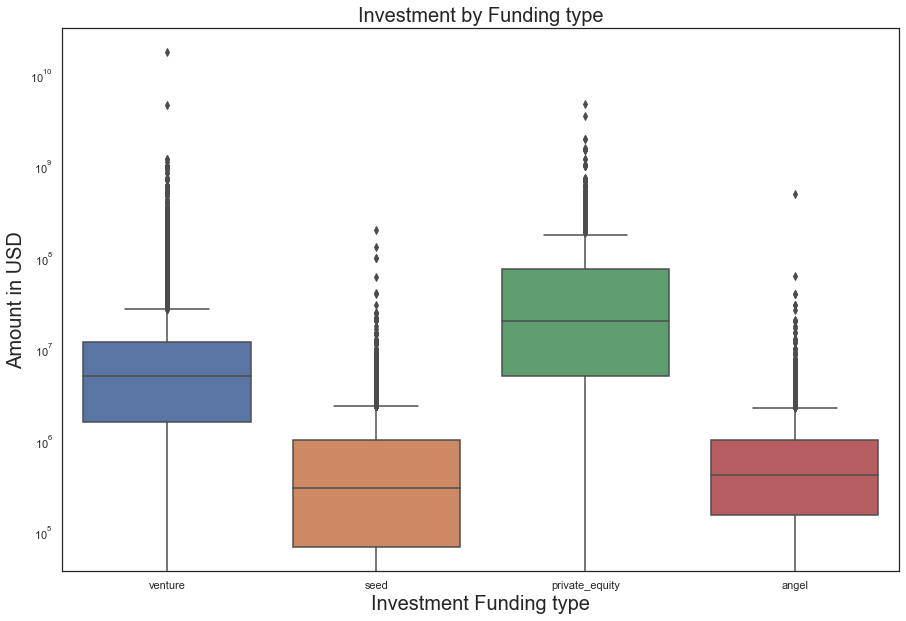

In [47]:
plt.figure(figsize=(15, 10))
sns.boxplot( data= master_frame ,x='funding_round_type', y='raised_amount_usd')
plt.yscale('log')
plt.xlabel("Investment Funding type", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Investment by Funding type",fontsize=20 )
plt.show()

In [48]:
#if you would see the mean values has huge variation on all types
master_frame.groupby('funding_round_type')['raised_amount_usd'].mean().sort_values(ascending=False)

funding_round_type
private_equity   73938486.28
venture          11724222.69
angel              971573.89
seed               747793.68
Name: raised_amount_usd, dtype: float64

In [49]:
#the values in median looks more prominent here which is not spreading and can be used further for analysis
master_frame.groupby('funding_round_type')['raised_amount_usd'].median().sort_values(ascending=False)

funding_round_type
private_equity   20000000.00
venture           5000000.00
angel              414906.00
seed               300000.00
Name: raised_amount_usd, dtype: float64

In [50]:
# compare the mean and median values across categories 
master_frame.pivot_table(values='raised_amount_usd', columns='funding_round_type', aggfunc=[np.median, np.mean])

median                                          mean  \
funding_round_type     angel private_equity      seed    venture     angel   
raised_amount_usd  414906.00    20000000.00 300000.00 5000000.00 971573.89   

                                                         
funding_round_type private_equity      seed     venture  
raised_amount_usd     73938486.28 747793.68 11724222.69

#### There is a huge difference between the mean and the median values for all four types. For type ‘private_equity’, for e.g. the median is  20m while the mean is about 70m.
#### if you look at the median values these values seems to be more representative as compare to mean and also after 75% there is huge spread of values so median values can be consider here as most representative values lets plot the graph and check

### The below barplot gives the idea of total amount where spark can insvest in terms of bar chart

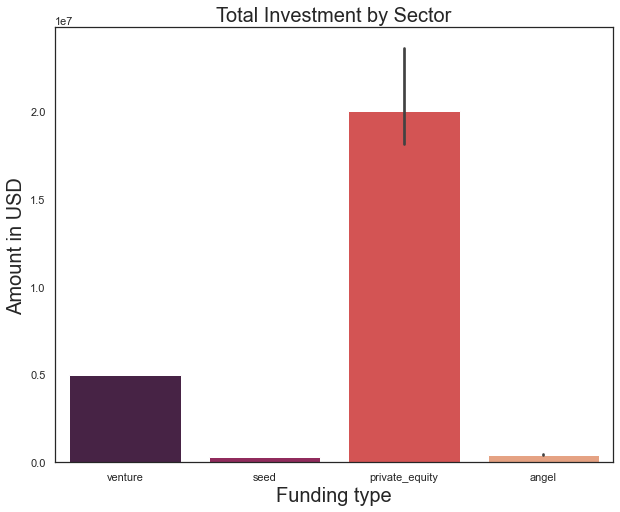

In [51]:
#Plotting median (raised_amount_usd) for the 4 different funding categories.
plt.figure(figsize=(10, 8))
sns.barplot(y='raised_amount_usd', x="funding_round_type", palette = "rocket",data=master_frame, estimator=np.median)
plt.xlabel("Funding type", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Total Investment by Sector",fontsize=20 )
plt.show()

### The below Pie chart indicates the heavily invested funding type 

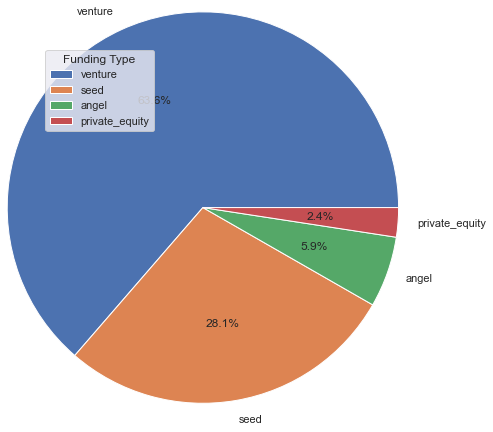

In [52]:
#also check the total count of prefered investment type of people
sns.set(rc={'figure.figsize':(6,6)})
round_types = master_frame.funding_round_type.value_counts()
plt.pie(round_types.values, labels=round_types.index, autopct='%.1f%%',radius=1.5, wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })
plt.legend(title="Funding Type",loc='upper left')
plt.show()

### ploting together and comparing most prefered investment type and the amount which false under 5 to 15 million bucket

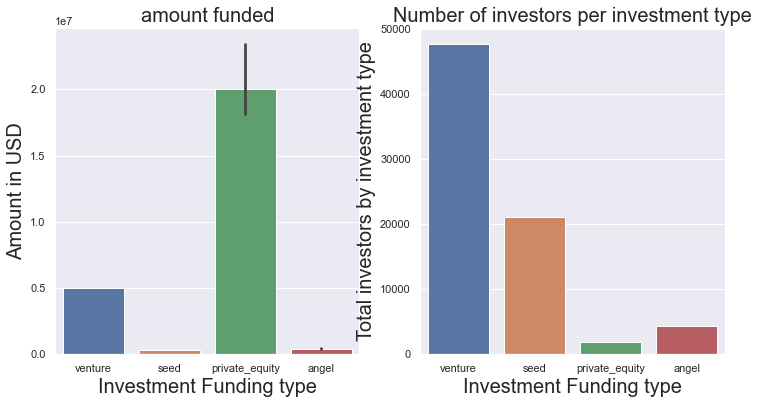

In [53]:
#  Create 2 subplots for amount funded(median) and heavily invested type respectively

# increase figure size 
plt.figure(figsize=(12, 6))

# subplot 1: the median values
plt.subplot(1, 2, 1)
sns.barplot(x='funding_round_type', y='raised_amount_usd', data=master_frame, estimator=np.median)
plt.xlabel("Investment Funding type", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("amount funded", fontsize=20)

# subplot 2: most prefered type
plt.subplot(1, 2, 2)
sns.countplot(x="funding_round_type", data=master_frame)
plt.xlabel("Investment Funding type", fontsize=20)
plt.ylabel("Total investors by investment type" , fontsize=20)
plt.title("Number of investors per investment type",fontsize=20)
plt.show()

### Thus, from the above plots, we can infer that:
- #### large no. of them are investing in the venture funding category.
- #### it is also falling in the bracket of 5-15million USD which Spark Funds have set up as their budget.

### venture is the right choice for Spark Funds 

##### Q:Representative funding amount of venture type?
##### Answer-5 million
##### Representative funding amount of angel type
##### Answer-0.41 millions
##### Representative funding amount of seed type
##### Answer-0.30 milllons
##### Representative funding amount of private equity type
##### Answer-20 millions

##### Considering that Spark Funds wants to invest between 5 to 15 million USD per  investment round, which investment type is the    most suitable for them?
##### Answer
##### We can clearly predict from pie chart and box plot,barchart that most of the investors are investing in venture funding type. The median of funding of venture type is 5 million so Spark Funds can choose this type of funding that is best suited for their strategy.

# Checkpoint 3: Country Analysis
### Goal: Spark Funds wants to see the top nine countries which have received the highest total funding (across ALL sectors for the chosen investment type)
- ### keep in mind we have to choose where most of the investors are investing. i.e venture
- ### the highest total funding based on countries

In [54]:
# purging our data only include venture type
master_frame = master_frame[master_frame['funding_round_type'].isin(['venture'])]
master_frame.describe()

,raised_amount_usd
count,47809.00
mean,11724222.69
std,88215713.61
min,0.00
25%,1600000.00
50%,5000000.00
75%,12000000.00
max,17600000000.00


In [55]:
#check the total entries 
master_frame.shape

(47809, 9)

In [56]:
#cheking the data 
master_frame.head()

,permalink,name,category_list,status,country_code,funding_round_permalink,funding_round_type,funded_at,raised_amount_usd
0,/organization/-fame,#fame,Media,operating,IND,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,05-01-2015,10000000.00
4,/organization/0-6-com,0-6.com,Curated Web,operating,CHN,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,19-03-2008,2000000.00
8,/organization/0ndine-biomedical-inc,Ondine Biomedical Inc.,Biotechnology,operating,CAN,/funding-round/954b9499724b946ad8c396a57a5f3b72,venture,21-12-2009,719491.00
10,/organization/0xdata,H2O.ai,Analytics,operating,USA,/funding-round/3bb2ee4a2d89251a10aaa735b1180e44,venture,09-11-2015,20000000.00
11,/organization/0xdata,H2O.ai,Analytics,operating,USA,/funding-round/ae2a174c06517c2394aed45006322a7e,venture,03-01-2013,1700000.00


In [57]:
master_frame['country_code'].describe()

count     47809
unique       97
top         USA
freq      35943
Name: country_code, dtype: object

In [58]:
#all the investment amounts values' for the different country codes in descending order.
country_total = master_frame.groupby('country_code')['raised_amount_usd'].sum().sort_values(ascending=False)
country_total.head(20)

country_code
USA   420068029342.00
CHN    39338918773.00
GBR    20072813004.00
IND    14261508718.00
CAN     9482217668.00
FRA     7226851352.00
ISR     6854350477.00
DEU     6306921981.00
JPN     3167647127.00
SWE     3145856571.00
NLD     2903875785.00
CHE     2801560264.00
SGP     2793917856.00
ESP     1827622434.00
BRA     1785817890.00
IRL     1669285543.00
RUS     1570426005.00
AUS     1319028698.00
DNK     1228310641.00
FIN     1043199709.00
Name: raised_amount_usd, dtype: float64

In [59]:
#Let’s check now the top 9 countries 
country_total[:9]

country_code
USA   420068029342.00
CHN    39338918773.00
GBR    20072813004.00
IND    14261508718.00
CAN     9482217668.00
FRA     7226851352.00
ISR     6854350477.00
DEU     6306921981.00
JPN     3167647127.00
Name: raised_amount_usd, dtype: float64

In [60]:
#create a data frame form top9 countries which has high funding
top9 = master_frame[master_frame['country_code'].isin(['USA', 'CHN', 'GBR', 'IND', 'CAN', 'FRA', 'ISR', 'DEU', 'JPN' ])]

In [61]:
top9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44118 entries, 0 to 114941
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                44118 non-null  object 
 1   name                     44118 non-null  object 
 2   category_list            44118 non-null  object 
 3   status                   44118 non-null  object 
 4   country_code             44118 non-null  object 
 5   funding_round_permalink  44118 non-null  object 
 6   funding_round_type       44118 non-null  object 
 7   funded_at                44118 non-null  object 
 8   raised_amount_usd        44118 non-null  float64
dtypes: float64(1), object(8)
memory usage: 3.4+ MB


In [62]:
#calculate total amount of each countries
top9.groupby('country_code')['raised_amount_usd'].sum().sort_values(ascending=False)

country_code
USA   420068029342.00
CHN    39338918773.00
GBR    20072813004.00
IND    14261508718.00
CAN     9482217668.00
FRA     7226851352.00
ISR     6854350477.00
DEU     6306921981.00
JPN     3167647127.00
Name: raised_amount_usd, dtype: float64

In [63]:
#calculate the total counts of all countries which has highest investments so far 
top9['country_code'].value_counts()

USA    35943
GBR     2041
CHN     1548
CAN     1246
FRA      912
IND      819
ISR      786
DEU      554
JPN      269
Name: country_code, dtype: int64

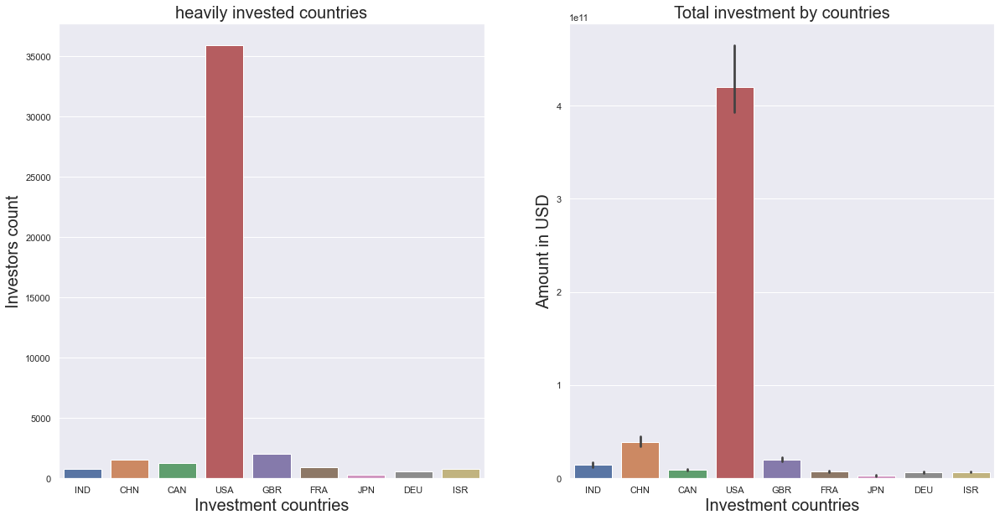

In [64]:
#Lets plot all the countries to see the view once for additional information to spark fund
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
sns.countplot(x="country_code", data=top9)
plt.xlabel("Investment countries", fontsize=20)
plt.ylabel("Investors count" , fontsize=20)
plt.title("heavily invested countries",fontsize=20)
plt.subplot(1, 2, 2)
sns.barplot(x="country_code", y="raised_amount_usd", data=top9, estimator=sum)
plt.xlabel("Investment countries", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Total investment by countries",fontsize=20)
plt.show()

#### Among all the countries if you see top 3 english countries are USA, GBR, IND and also most of the investment is happening in those countries so filtering based on these countries USA , GBR and IND

In [65]:
#filter the master_frame to top3 countries
top3 = master_frame[(master_frame.country_code=='USA') | (master_frame.country_code=='GBR') | (master_frame.country_code=='IND')]
top3.head()

,permalink,name,category_list,status,country_code,funding_round_permalink,funding_round_type,funded_at,raised_amount_usd
0,/organization/-fame,#fame,Media,operating,IND,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,05-01-2015,10000000.00
10,/organization/0xdata,H2O.ai,Analytics,operating,USA,/funding-round/3bb2ee4a2d89251a10aaa735b1180e44,venture,09-11-2015,20000000.00
11,/organization/0xdata,H2O.ai,Analytics,operating,USA,/funding-round/ae2a174c06517c2394aed45006322a7e,venture,03-01-2013,1700000.00
12,/organization/0xdata,H2O.ai,Analytics,operating,USA,/funding-round/e1cfcbe1bdf4c70277c5f29a3482f24e,venture,19-07-2014,8900000.00
22,/organization/1-mainstream,1 Mainstream,Apps|Cable|Distribution|Software,acquired,USA,/funding-round/b952cbaf401f310927430c97b68162ea,venture,17-03-2015,5000000.00


In [66]:
top3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38803 entries, 0 to 114936
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                38803 non-null  object 
 1   name                     38803 non-null  object 
 2   category_list            38803 non-null  object 
 3   status                   38803 non-null  object 
 4   country_code             38803 non-null  object 
 5   funding_round_permalink  38803 non-null  object 
 6   funding_round_type       38803 non-null  object 
 7   funded_at                38803 non-null  object 
 8   raised_amount_usd        38803 non-null  float64
dtypes: float64(1), object(8)
memory usage: 3.0+ MB


In [67]:
# Check the total sum of all three countries
top3.groupby('country_code')['raised_amount_usd'].sum().sort_values(ascending=False)

country_code
USA   420068029342.00
GBR    20072813004.00
IND    14261508718.00
Name: raised_amount_usd, dtype: float64

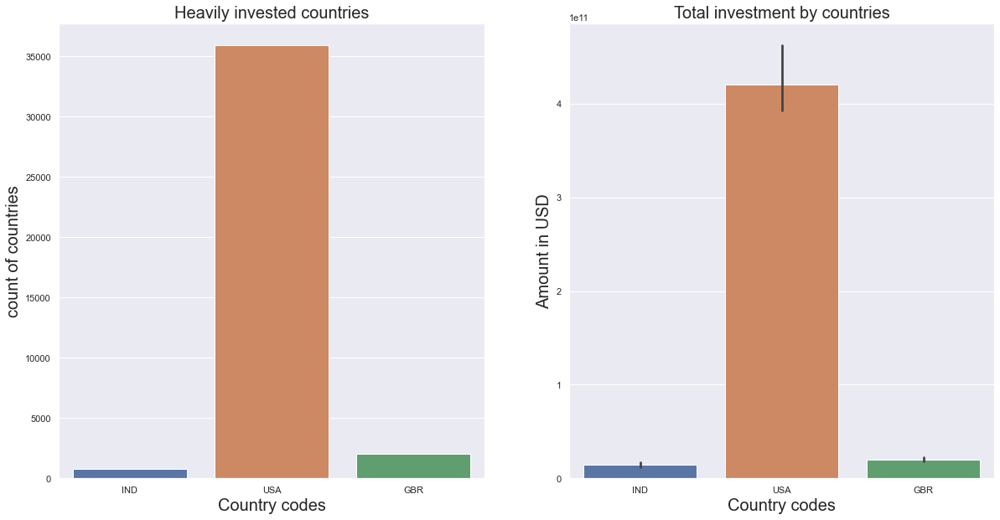

In [68]:
# Plotting the total investment across top 3 english language country_code 
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
sns.countplot(x="country_code", data=top3)
plt.xlabel("Country codes", fontsize=20)
plt.ylabel("count of countries" , fontsize=20)
plt.title("Heavily invested countries", fontsize=20)
plt.subplot(1, 2, 2)
sns.barplot(x="country_code", y="raised_amount_usd", data=top3, estimator=sum)
plt.xlabel("Country codes", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Total investment by countries", fontsize=20)
plt.show()

# Checkpoint 4: Sector Analysis 1


In [69]:
top3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38803 entries, 0 to 114936
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                38803 non-null  object 
 1   name                     38803 non-null  object 
 2   category_list            38803 non-null  object 
 3   status                   38803 non-null  object 
 4   country_code             38803 non-null  object 
 5   funding_round_permalink  38803 non-null  object 
 6   funding_round_type       38803 non-null  object 
 7   funded_at                38803 non-null  object 
 8   raised_amount_usd        38803 non-null  float64
dtypes: float64(1), object(8)
memory usage: 4.2+ MB


In [70]:
#Get the main_category
top3.loc[:, 'main_category'] = top3['category_list'].apply(lambda x: x.split("|")[0])

In [71]:
# drop the category_list column as we don't need it anymore
top3 = top3.drop('category_list', axis=1)
top3.head()

,permalink,name,status,country_code,funding_round_permalink,funding_round_type,funded_at,raised_amount_usd,main_category
0,/organization/-fame,#fame,operating,IND,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,05-01-2015,10000000.00,Media
10,/organization/0xdata,H2O.ai,operating,USA,/funding-round/3bb2ee4a2d89251a10aaa735b1180e44,venture,09-11-2015,20000000.00,Analytics
11,/organization/0xdata,H2O.ai,operating,USA,/funding-round/ae2a174c06517c2394aed45006322a7e,venture,03-01-2013,1700000.00,Analytics
12,/organization/0xdata,H2O.ai,operating,USA,/funding-round/e1cfcbe1bdf4c70277c5f29a3482f24e,venture,19-07-2014,8900000.00,Analytics
22,/organization/1-mainstream,1 Mainstream,acquired,USA,/funding-round/b952cbaf401f310927430c97b68162ea,venture,17-03-2015,5000000.00,Apps


In [72]:
top3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38803 entries, 0 to 114936
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                38803 non-null  object 
 1   name                     38803 non-null  object 
 2   status                   38803 non-null  object 
 3   country_code             38803 non-null  object 
 4   funding_round_permalink  38803 non-null  object 
 5   funding_round_type       38803 non-null  object 
 6   funded_at                38803 non-null  object 
 7   raised_amount_usd        38803 non-null  float64
 8   main_category            38803 non-null  object 
dtypes: float64(1), object(8)
memory usage: 4.2+ MB


In [73]:
#Read mapping file
mapping = pd.read_csv("mapping.csv", encoding = "ISO-8859-1")
mapping.head(5)

,category_list,Automotive & Sports,Blanks,Cleantech / Semiconductors,Entertainment,Health,Manufacturing,"News, Search and Messaging",Others,"Social, Finance, Analytics, Advertising"
0,NaN,0,1,0,0,0,0,0,0,0
1,3D,0,0,0,0,0,1,0,0,0
2,3D Printing,0,0,0,0,0,1,0,0,0
3,3D Technology,0,0,0,0,0,1,0,0,0
4,Accounting,0,0,0,0,0,0,0,0,1


In [74]:
mapping.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 688 entries, 0 to 687
Data columns (total 10 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   category_list                            687 non-null    object
 1   Automotive & Sports                      688 non-null    int64 
 2   Blanks                                   688 non-null    int64 
 3   Cleantech / Semiconductors               688 non-null    int64 
 4   Entertainment                            688 non-null    int64 
 5   Health                                   688 non-null    int64 
 6   Manufacturing                            688 non-null    int64 
 7   News, Search and Messaging               688 non-null    int64 
 8   Others                                   688 non-null    int64 
 9   Social, Finance, Analytics, Advertising  688 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 53.9+ KB


In [75]:
#if you see it has null values so lets get rid of them
# missing values in mapping file
mapping.isnull().sum()

category_list                              1
Automotive & Sports                        0
Blanks                                     0
Cleantech / Semiconductors                 0
Entertainment                              0
Health                                     0
Manufacturing                              0
News, Search and Messaging                 0
Others                                     0
Social, Finance, Analytics, Advertising    0
dtype: int64

In [76]:
# remove the row with missing values
mapping = mapping[~pd.isnull(mapping['category_list'])]
mapping.isnull().sum()

category_list                              0
Automotive & Sports                        0
Blanks                                     0
Cleantech / Semiconductors                 0
Entertainment                              0
Health                                     0
Manufacturing                              0
News, Search and Messaging                 0
Others                                     0
Social, Finance, Analytics, Advertising    0
dtype: int64

In [77]:
mapping.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 687 entries, 1 to 687
Data columns (total 10 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   category_list                            687 non-null    object
 1   Automotive & Sports                      687 non-null    int64 
 2   Blanks                                   687 non-null    int64 
 3   Cleantech / Semiconductors               687 non-null    int64 
 4   Entertainment                            687 non-null    int64 
 5   Health                                   687 non-null    int64 
 6   Manufacturing                            687 non-null    int64 
 7   News, Search and Messaging               687 non-null    int64 
 8   Others                                   687 non-null    int64 
 9   Social, Finance, Analytics, Advertising  687 non-null    int64 
dtypes: int64(9), object(1)
memory usage: 59.0+ KB


In [78]:
# converting common columns to lowercase for further merging the data as the columns are not unique due to lower and uper case
mapping['category_list'] = mapping['category_list'].str.lower()
top3['main_category'] = top3['main_category'].str.lower()

In [79]:
# look at heads
mapping.head()

,category_list,Automotive & Sports,Blanks,Cleantech / Semiconductors,Entertainment,Health,Manufacturing,"News, Search and Messaging",Others,"Social, Finance, Analytics, Advertising"
1,3d,0,0,0,0,0,1,0,0,0
2,3d printing,0,0,0,0,0,1,0,0,0
3,3d technology,0,0,0,0,0,1,0,0,0
4,accounting,0,0,0,0,0,0,0,0,1
5,active lifestyle,0,0,0,0,1,0,0,0,0


In [80]:
#melting mapping csv to get all the row values into one column
mapping = pd.melt(mapping, id_vars=['category_list'])
mapping.head(30)

,category_list,variable,value
0,3d,Automotive & Sports,0
1,3d printing,Automotive & Sports,0
2,3d technology,Automotive & Sports,0
3,accounting,Automotive & Sports,0
4,active lifestyle,Automotive & Sports,0
5,ad targeting,Automotive & Sports,0
6,advanced materials,Automotive & Sports,0
7,adventure travel,Automotive & Sports,1
8,advertising,Automotive & Sports,0
9,advertising exchanges,Automotive & Sports,0


In [81]:
# removing zero's values which is not relevent 
mapping = mapping[~(mapping.value == 0)]
mapping.head(20)

,category_list,variable,value
7,adventure travel,Automotive & Sports,1
13,aerospace,Automotive & Sports,1
44,auto,Automotive & Sports,1
45,automated kiosk,Automotive & Sports,1
46,automotive,Automotive & Sports,1
56,bicycles,Automotive & Sports,1
68,boating industry,Automotive & Sports,1
86,cad,Automotive & Sports,1
92,cars,Automotive & Sports,1
187,design,Automotive & Sports,1


In [82]:
#drop column values which is no longer required
mapping = mapping.drop('value', axis = 1)
mapping

,category_list,variable
7,adventure travel,Automotive & Sports
13,aerospace,Automotive & Sports
44,auto,Automotive & Sports
45,automated kiosk,Automotive & Sports
46,automotive,Automotive & Sports
56,bicycles,Automotive & Sports
68,boating industry,Automotive & Sports
86,cad,Automotive & Sports
92,cars,Automotive & Sports
187,design,Automotive & Sports


In [83]:
#renaming the column to avoaid confusion of two column
mapping.rename(columns={'variable':'main_sector'}, inplace=True)
mapping.head(20)

,category_list,main_sector
7,adventure travel,Automotive & Sports
13,aerospace,Automotive & Sports
44,auto,Automotive & Sports
45,automated kiosk,Automotive & Sports
46,automotive,Automotive & Sports
56,bicycles,Automotive & Sports
68,boating industry,Automotive & Sports
86,cad,Automotive & Sports
92,cars,Automotive & Sports
187,design,Automotive & Sports


In [84]:
#check the data
mapping['category_list']

7                            adventure travel
13                                  aerospace
44                                       auto
45                            automated kiosk
46                                 automotive
56                                   bicycles
68                           boating industry
86                                        cad
92                                       cars
187                                    design
188                                 designers
212                                    drones
225                         electric vehicles
291                                     fuels
330                            heavy industry
363                     industrial automation
408                                limousines
601                                    soccer
625                            sporting goods
626                                    sports
651                            transportation
656                      unmanned 

##### We could see something fishy here all the values which should have 'na' it is replaced by 0 .. lets correct this

In [85]:
# replacing '0' with 'na'
mapping['category_list'] = mapping['category_list'].apply(lambda x: x.replace('0', 'na'))
mapping['category_list']

7                            adventure travel
13                                  aerospace
44                                       auto
45                            automated kiosk
46                                 automotive
56                                   bicycles
68                           boating industry
86                                        cad
92                                       cars
187                                    design
188                                 designers
212                                    drones
225                         electric vehicles
291                                     fuels
330                            heavy industry
363                     industrial automation
408                                limousines
601                                    soccer
625                            sporting goods
626                                    sports
651                            transportation
656                      unmanned 

In [86]:
top3.shape

(38803, 9)

In [87]:
#lets merge the final data
sector_merge = pd.merge(top3, mapping, how='inner', left_on='main_category', right_on='category_list')
sector_merge.head()

,permalink,name,status,country_code,funding_round_permalink,funding_round_type,funded_at,raised_amount_usd,main_category,category_list,main_sector
0,/organization/-fame,#fame,operating,IND,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,05-01-2015,10000000.00,media,media,Entertainment
1,/organization/90min,90min,operating,GBR,/funding-round/21a2cbf6f2fb2a1c2a61e04bf930dfe6,venture,06-10-2015,15000000.00,media,media,Entertainment
2,/organization/90min,90min,operating,GBR,/funding-round/bd626ed022f5c66574b1afe234f3c90d,venture,07-05-2013,5800000.00,media,media,Entertainment
3,/organization/90min,90min,operating,GBR,/funding-round/fd4b15e8c97ee2ffc0acccdbe1a98810,venture,26-03-2014,18000000.00,media,media,Entertainment
4,/organization/all-def-digital,All Def Digital,operating,USA,/funding-round/452a2342fe720285c3b92e9bd927d9ba,venture,06-08-2014,5000000.00,media,media,Entertainment


In [88]:
sector_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38788 entries, 0 to 38787
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                38788 non-null  object 
 1   name                     38788 non-null  object 
 2   status                   38788 non-null  object 
 3   country_code             38788 non-null  object 
 4   funding_round_permalink  38788 non-null  object 
 5   funding_round_type       38788 non-null  object 
 6   funded_at                38788 non-null  object 
 7   raised_amount_usd        38788 non-null  float64
 8   main_category            38788 non-null  object 
 9   category_list            38788 non-null  object 
 10  main_sector              38788 non-null  object 
dtypes: float64(1), object(10)
memory usage: 3.6+ MB


In [89]:
sector_merge.shape

(38788, 11)

# Checkpoint 5: Sector Analysis 2

In [90]:
# lets drop all rows whoes investment is not between 5 and 15 million
#coz spark fund wants to invest only between this amount
sector_merge = sector_merge.drop(sector_merge[(sector_merge.raised_amount_usd < 5000000)].index)
sector_merge = sector_merge.drop(sector_merge[(sector_merge.raised_amount_usd > 15000000)].index)

In [91]:
sector_merge.shape

(13012, 11)

In [92]:
#segregate all the countrywise data to have a clear idea and plot them further
D1 = sector_merge[sector_merge['country_code'] == 'USA']
D2  = sector_merge[sector_merge['country_code'] == 'GBR']
D3  = sector_merge[sector_merge['country_code'] == 'IND']

In [93]:
#print the data exist 
print(len(D1))
print(len(D2))
print(len(D3))

12063
621
328


## USA - United States of America - Country 1

In [94]:
#Total no. of investments
print("Total no. of Investments: ",D1['raised_amount_usd'].count())

#Total amount of investments
print("Total amount of Investments: ",D1['raised_amount_usd'].sum())


Total no. of Investments:  12063
Total amount of Investments:  107757097294.0


In [95]:
# USA 
D1.pivot_table(values = 'raised_amount_usd',index = ['main_sector'], aggfunc = {'sum','count'})

,count,sum
main_sector,,
Automotive & Sports,167,1454104361.00
Cleantech / Semiconductors,2350,21633430822.00
Entertainment,591,5099197982.00
Health,909,8211859357.00
Manufacturing,799,7258553378.00
"News, Search and Messaging",1583,13971567428.00
Others,2950,26321007002.00
"Social, Finance, Analytics, Advertising",2714,23807376964.00


In [96]:
#Sorting the sector name in descending order
D1.groupby('main_sector')['raised_amount_usd'].count().sort_values(ascending=False)

main_sector
Others                                     2950
Social, Finance, Analytics, Advertising    2714
Cleantech / Semiconductors                 2350
News, Search and Messaging                 1583
Health                                      909
Manufacturing                               799
Entertainment                               591
Automotive & Sports                         167
Name: raised_amount_usd, dtype: int64

In [97]:
#Top 3 companies in terms of investment amount in the "Others" sector 
D1[D1['main_sector'] == "Others" ].groupby('permalink')['raised_amount_usd'].sum().sort_values(ascending=False).head(3)

permalink
/organization/virtustream         64300000.00
/organization/capella             54968051.00
/organization/airtight-networks   54201907.00
Name: raised_amount_usd, dtype: float64

In [98]:
#Finding top 3 companies in terms of investment amount in the "Social,Finance,Analytics,Advertising" sector
D1[D1['main_sector'] == "Social, Finance, Analytics, Advertising" ].groupby('permalink')['raised_amount_usd'].sum().sort_values(ascending=False).head(3)

permalink
/organization/shotspotter   67933006.00
/organization/demandbase    63000000.00
/organization/intacct       61800000.00
Name: raised_amount_usd, dtype: float64

# GBR -The Great Britain

In [99]:
#Total no. of investments
print("Total no. of Investments: ",D2['raised_amount_usd'].count())

#Total amount of investments
print("Total amount of Investments: ",D2['raised_amount_usd'].sum())

Total no. of Investments:  621
Total amount of Investments:  5379078691.0


In [100]:
D2.pivot_table(values = 'raised_amount_usd',index = ['main_sector'], aggfunc = {'sum','count'})

,count,sum
main_sector,,
Automotive & Sports,16,167051565.00
Cleantech / Semiconductors,130,1163990056.00
Entertainment,56,482784687.00
Health,24,214537510.00
Manufacturing,42,361940335.00
"News, Search and Messaging",73,615746235.00
Others,147,1283624289.00
"Social, Finance, Analytics, Advertising",133,1089404014.00


In [101]:
#Sorting the sector names (no. of investments wise) in descending order:
D2.groupby('main_sector')['raised_amount_usd'].count().sort_values(ascending=False)

main_sector
Others                                     147
Social, Finance, Analytics, Advertising    133
Cleantech / Semiconductors                 130
News, Search and Messaging                  73
Entertainment                               56
Manufacturing                               42
Health                                      24
Automotive & Sports                         16
Name: raised_amount_usd, dtype: int64

In [102]:
#Finding top 3 companies in terms of investment amount in the "Others" sector 
D2[D2['main_sector'] == "Others" ].groupby('permalink')['raised_amount_usd'].sum().sort_values(ascending=False).head(3)

permalink
/organization/electric-cloud   37000000.00
/organization/sensage          36250000.00
/organization/enigmatic        32500000.00
Name: raised_amount_usd, dtype: float64

In [103]:
#Finding top 3 companies in terms of investment amount in the "Social,Finance,Analytics,Advertising" sector
D2[D2['main_sector'] == "Social, Finance, Analytics, Advertising" ].groupby('permalink')['raised_amount_usd'].sum().sort_values(ascending=False).head(3)

permalink
/organization/celltick-technologies   37500000.00
/organization/mythings                34000000.00
/organization/zopa                    32900000.00
Name: raised_amount_usd, dtype: float64

# IND - India

In [104]:
#Total no. of investments
print("Total no. of Investments: ",D3['raised_amount_usd'].count())

#Total amount of investments
print("Total amount of Investments: ",D3['raised_amount_usd'].sum())

Total no. of Investments:  328
Total amount of Investments:  2949543602.0


In [105]:
D3.pivot_table(values = 'raised_amount_usd',index = ['main_sector'], aggfunc = {'sum','count'})

,count,sum
main_sector,,
Automotive & Sports,13,136900000.00
Cleantech / Semiconductors,20,165380000.00
Entertainment,33,280830000.00
Health,19,167740000.00
Manufacturing,21,200900000.00
"News, Search and Messaging",52,433834545.00
Others,110,1013409507.00
"Social, Finance, Analytics, Advertising",60,550549550.00


In [106]:
#Sorting the sector names (no. of investments wise) in descending order:
D3.groupby('main_sector')['raised_amount_usd'].count().sort_values(ascending=False)

main_sector
Others                                     110
Social, Finance, Analytics, Advertising     60
News, Search and Messaging                  52
Entertainment                               33
Manufacturing                               21
Cleantech / Semiconductors                  20
Health                                      19
Automotive & Sports                         13
Name: raised_amount_usd, dtype: int64

In [107]:
#Finding top 3 companies in terms of investment amount in the "Others" sector 
D3[D3['main_sector'] == "Others" ].groupby('permalink')['raised_amount_usd'].sum().sort_values(ascending=False).head(3)

permalink
/organization/firstcry-com   39000000.00
/organization/myntra         38000000.00
/organization/commonfloor    32900000.00
Name: raised_amount_usd, dtype: float64

In [108]:
#Finding top 3 companies in terms of investment amount in the "Social,Finance,Analytics,Advertising" sector
D3[D3['main_sector'] == "Social, Finance, Analytics, Advertising" ].groupby('permalink')['raised_amount_usd'].sum().sort_values(ascending=False).head(3)

permalink
/organization/manthan-systems   50700000.00
/organization/komli-media       28000000.00
/organization/shopclues-com     25000000.00
Name: raised_amount_usd, dtype: float64

##### creating a master dataframe with all the data for the top 3 sectors of the top 3 countries.

In [109]:
data_master=D1[D1['main_sector'].isin(['Others','Social, Finance, Analytics, Advertising','Cleantech / Semiconductors'])]

data_master.shape

(8014, 11)

In [110]:
data_master=data_master.append(D2[D2['main_sector'].isin(['Others','Social, Finance, Analytics, Advertising','Cleantech / Semiconductors'])], ignore_index=True)
data_master.shape

(8424, 11)

In [111]:
data_master=data_master.append(D3[D3['main_sector'].isin(['Others','Social, Finance, Analytics, Advertising','News, Search and Messaging'])], ignore_index=True)
data_master.shape

(8646, 11)

# 6. Plots

## USA plots - first country 

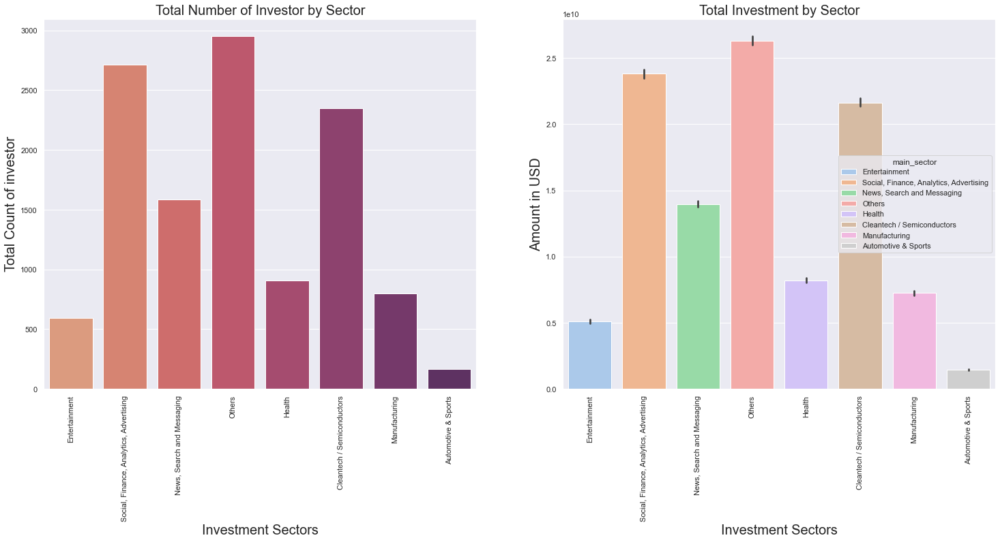

In [112]:
#bar plots showcasing the total count/sum of the investments for all the 8 sectors in USA.
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.countplot(x="main_sector", palette = "flare",data=D1 )
plt.xticks(rotation='vertical')
plt.xlabel("Investment Sectors", fontsize=20)
plt.ylabel("Total Count of investor" , fontsize=20)
plt.title("Total Number of Investor by Sector",fontsize=20 )
plt.subplot(1, 2, 2)
sns.barplot(x="main_sector", y="raised_amount_usd",palette = "pastel",dodge=False, hue="main_sector",data=D1, estimator=sum)
plt.xticks(rotation='vertical')
plt.xlabel("Investment Sectors", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Total Investment by Sector",fontsize=20 )
plt.show()

# GBR 

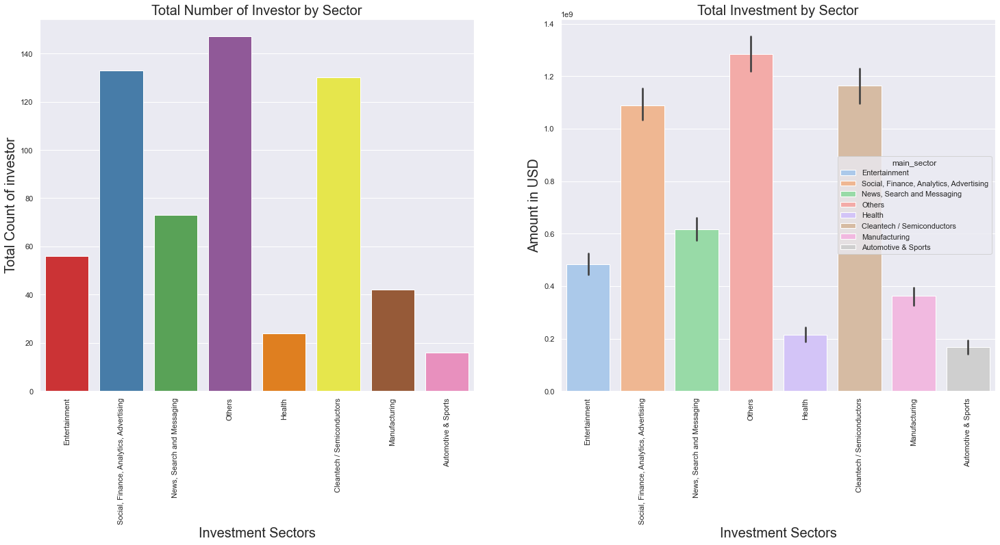

In [113]:
#bar plots showcasing the total count/sum of the investments for all the 8 sectors in GBR.
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.countplot(x="main_sector", palette = "Set1",data=D2 )
plt.xticks(rotation='vertical')
plt.xlabel("Investment Sectors", fontsize=20)
plt.ylabel("Total Count of investor" , fontsize=20)
plt.title("Total Number of Investor by Sector",fontsize=20 )
plt.subplot(1, 2, 2)
sns.barplot(x="main_sector", y="raised_amount_usd",palette = "pastel",dodge=False, hue="main_sector",data=D2, estimator=sum)
plt.xticks(rotation='vertical')
plt.xlabel("Investment Sectors", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Total Investment by Sector",fontsize=20 )
plt.show()

# IND

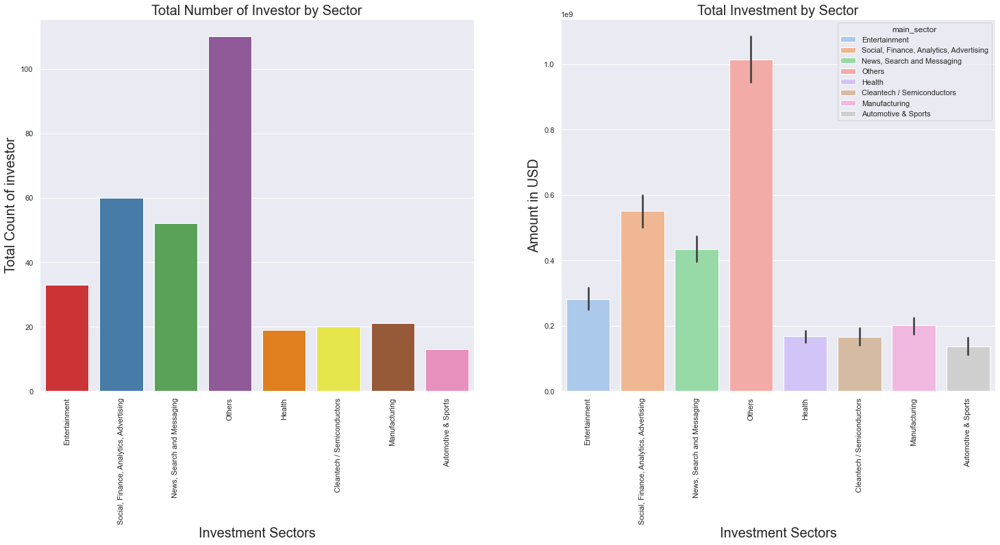

In [114]:
#bar plots showcasing the total count/sum of the investments for all the 8 sectors in GBR.
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.countplot(x="main_sector", palette = "Set1",data=D3 )
plt.xticks(rotation='vertical')
plt.xlabel("Investment Sectors", fontsize=20)
plt.ylabel("Total Count of investor" , fontsize=20)
plt.title("Total Number of Investor by Sector",fontsize=20 )
plt.subplot(1, 2, 2)
sns.barplot(x="main_sector", y="raised_amount_usd",palette = "pastel",dodge=False, hue="main_sector",data=D3, estimator=sum)
plt.xticks(rotation='vertical')
plt.xlabel("Investment Sectors", fontsize=20)
plt.ylabel("Amount in USD" , fontsize=20)
plt.title("Total Investment by Sector",fontsize=20 )
plt.show()

## Plot accross all three countries

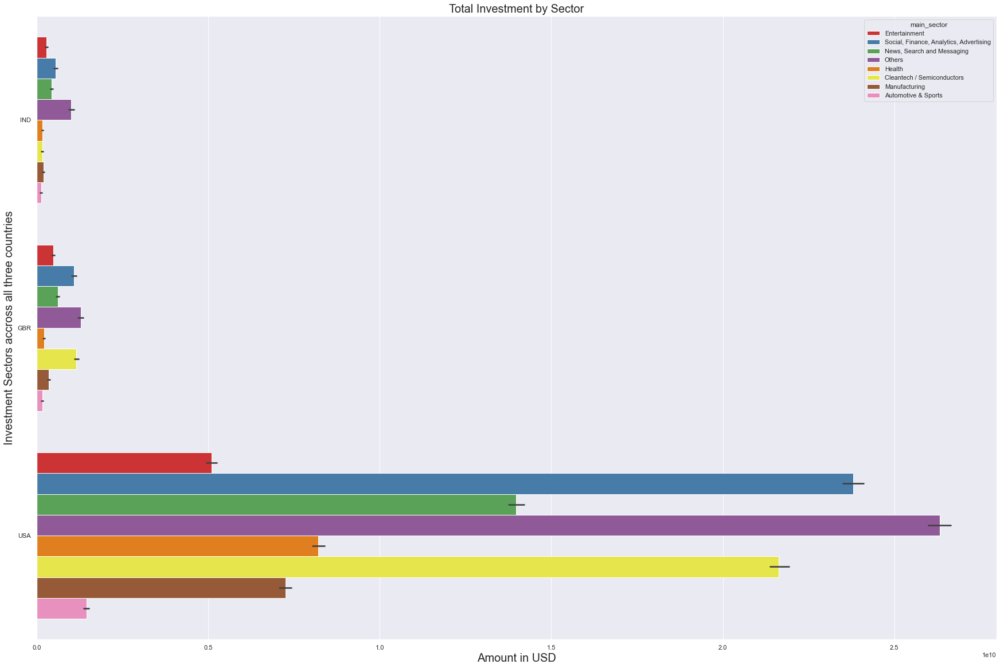

In [115]:
#plot showcasing the sum of the investments for all the 8 sectors in the top 3 English speaking countries.
plt.figure(figsize=(30, 20))
sns.barplot(y='country_code', x='raised_amount_usd', hue="main_sector",  palette = "Set1", data=sector_merge, estimator=np.sum)
plt.ylabel("Investment Sectors accross all three countries", fontsize=20)
plt.xlabel("Amount in USD" , fontsize=20)
plt.title("Total Investment by Sector",fontsize=20 )
plt.show()

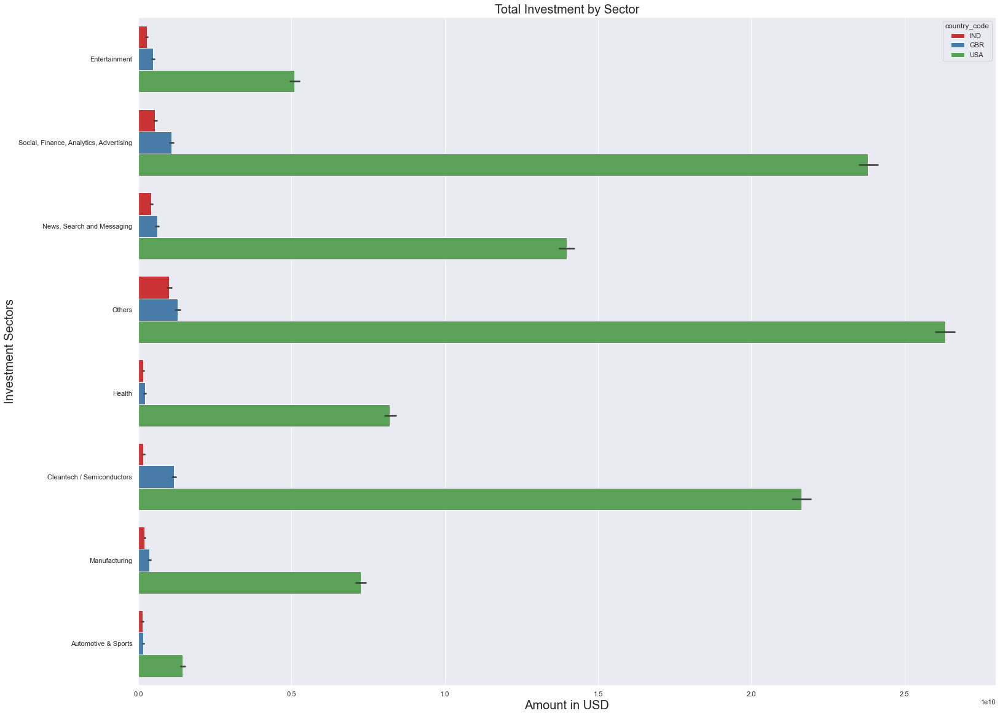

In [116]:
#another plot showcasing the sum of the investments for all the 8 sectors in the top 3 English speaking countries.
plt.figure(figsize=(25, 20))
sns.barplot(y='main_sector', x='raised_amount_usd', hue="country_code",  palette = "Set1",data=sector_merge, estimator=np.sum)
plt.ylabel("Investment Sectors", fontsize=20)
plt.xlabel("Amount in USD" , fontsize=20)
plt.title("Total Investment by Sector",fontsize=20 )
plt.show()

### sector wise investment count of the top 3 sectors of the top3 countries.

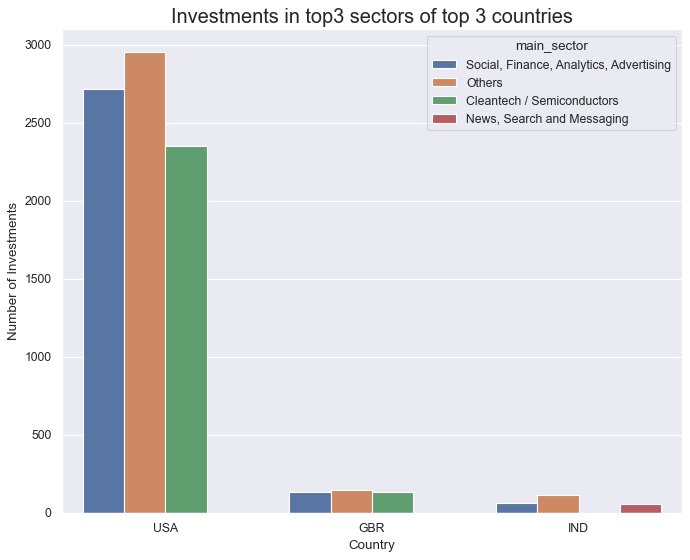

In [117]:
# set figure size for larger figure
plt.figure(num=None, figsize=(10, 8), dpi=80, facecolor='w', edgecolor='k')

s=sns.barplot(x='country_code', y='raised_amount_usd', hue="main_sector", data=data_master,estimator=lambda x: len(x))
s.set(xlabel='Country', ylabel='Number of Investments')
s.set_title('Investments in top3 sectors of top 3 countries',fontsize =18)
plt.show()